# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

### *Helper functions*

In [1]:
# Imports
import numpy as np
import cv2
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Helper function to display images
def displayImages(images, cols, rows, figsize):
    # def showImages(images, cols = 4, rows = 5, figsize=(15,10), cmap = None):
    """
    Display `images` on a [`cols`, `rows`] subplot grid.
    """
    imgLength = len(images)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    indexes = range(cols * rows)
    for ax, index in zip(axes.flat, indexes):
        if index < imgLength:
            imagePathName, image = images[index]
            ax.imshow(image)
            ax.set_title(imagePathName)
            

# Read in image names for calibration
inputCalibImages = glob.glob('./camera_cal/calibration*.jpg')

### *Camera calibration*

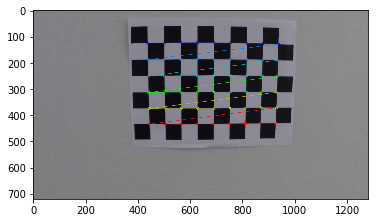

In [2]:
# Arrays to store object points and image points from all the images
objpoints = [] #3D points in real world space
imgpoints = [] #2D points in image plane

# Size of corners
nx = 9
ny = 6

# Image size
sampleImage = mpimg.imread(inputCalibImages[0])
imageShape = (sampleImage.shape[1], sampleImage.shape[0])

# Prepare object points
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Create output directory for camera calibration output images
cameraCalOutputDir =  'camera_cal_output'
if not os.path.exists(cameraCalOutputDir):
    os.makedirs(cameraCalOutputDir)
    
# Interate throuh images to find the image points and object points
for fname in inputCalibImages:
    # Read in each image
    img = mpimg.imread(fname) #TODO : Try cv2.imread
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners (gray, (nx,ny), None)
    
    # If corners are found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        # draw and display the corners
        img = cv2.drawChessboardCorners (img, (nx,ny), corners, ret)
        plt.imshow(img)
        
        # save each output image 
        cameraCalOutputImagePath = fname.replace("camera_cal/","camera_cal_output/")
        cv2.imwrite(cameraCalOutputImagePath, img)
        

In [3]:
# Find the Camera Matrix and Distortion coefficients 
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imageShape, None, None)

## Apply a distortion correction to raw images

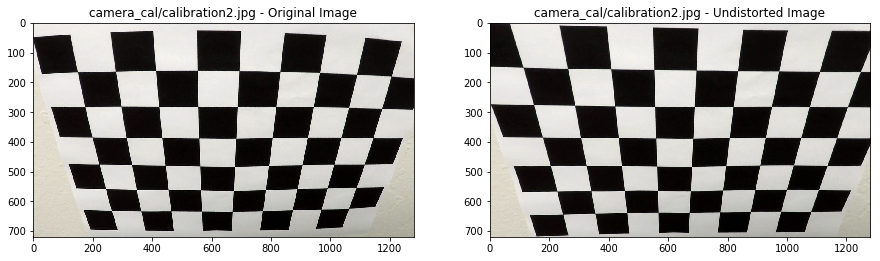

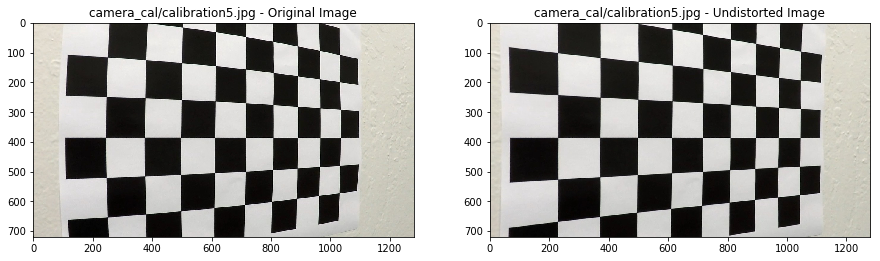

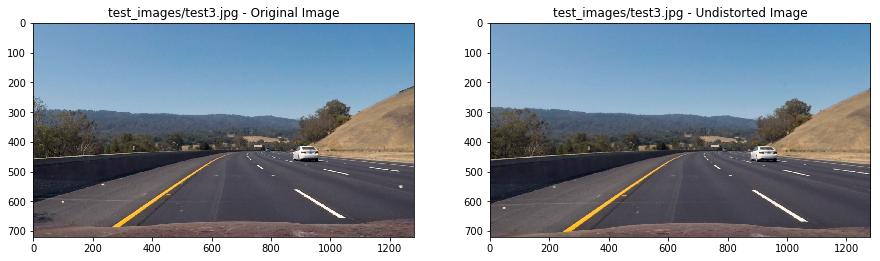

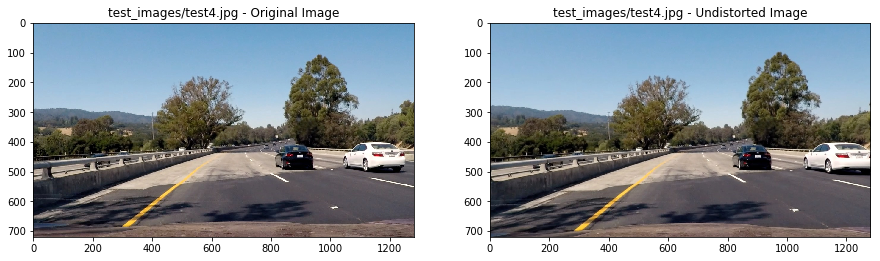

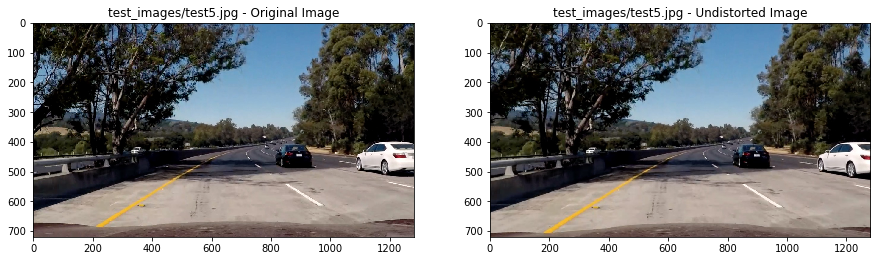

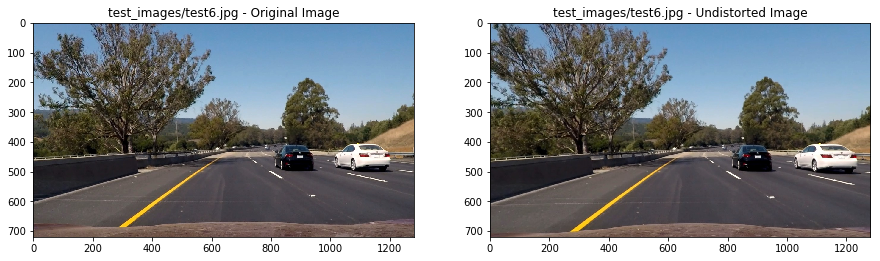

In [4]:
# Function to undistort an image - pass in image matrix in RGB format
def UndistortImage (imgRGB, mtx , dist):
    # Do not have to convert from BGR to RGB as mpimg.imread was used
    imgUndist = cv2.undistort(imgRGB, mtx, dist, None, mtx)
    return imgUndist

# Display original and processed image as comparison
def displayImageComparison(fileName, origImg, processedImg, processText, cmap=None):
    plt.figure(figsize=(15,8))
    plt.subplot(1,2,1)
    plt.title(fileName + ' - Original Image')
    fig =plt.imshow(origImg)
    # Plot undistorted image
    plt.subplot(1,2,2)
    plt.title(fileName + processText)
    fig = plt.imshow(processedImg, cmap=cmap)

# Examples of original and undistorted images
egImages = ["camera_cal/calibration2.jpg" , "camera_cal/calibration5.jpg", "test_images/test3.jpg", "test_images/test4.jpg", "test_images/test5.jpg" , "test_images/test6.jpg"]

# Undistort and display the image
for file in egImages:
    imageDataRGB = mpimg.imread(file)
    imgUndist = UndistortImage (imageDataRGB, mtx , dist)
    displayImageComparison(file, imageDataRGB, imgUndist, ' - Undistorted Image')
    
    # Save undistorted image
    imgUndist_RGB = cv2.cvtColor(imgUndist, cv2.COLOR_BGR2RGB)
    undistOutputImagePath = file.replace(".jpg","_undist.jpg")
    cv2.imwrite(undistOutputImagePath, imgUndist_RGB)

## Use color transforms, gradients, etc., to create a thresholded binary image

### *Function definitions of thresholding*

In [5]:
'''================ Gradient thresholding ======================='''

# Absolute gradient binary
def abs_grad_sobel_threshold (image, orient='x' , sobel_kernel=3 , thresh=(0, 255)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobelabs = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        sobelabs = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    scaled_sobel = np.uint8(sobelabs*255 / np.max(sobelabs))
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel>=thresh[0]) & (scaled_sobel<=thresh[1])] = 1
    return grad_binary
    

# Gradient magnitude binary
def mag_sobel_threshold(image, sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    gradmag = np.sqrt((sobelx**2) + (sobely**2))
    scaled_sobel = np.uint8(255*gradmag / np.max(gradmag))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return mag_binary

# Gradient direction binary
def dir_sobel_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelabs_x = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobelabs_y = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    grad_dir = np.arctan2(sobelabs_y, sobelabs_x)
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    return dir_binary

'''================ Color thresholding ======================='''
# RGB thresholding
def color_threshold_RGB(image, color_channel='R', RGB_thresh=(0,255)):
    if ((color_channel=='R') or (color_channel=='G') or (color_channel=='B')):
        #img = cv2.imread(image)
        #imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        R = image[:,:,0]
        G = image[:,:,1]
        B = image[:,:,2]
        rgb_binary = np.zeros_like(R)
        if color_channel=='R':
            rgb_binary[(R > RGB_thresh[0]) & (R <= RGB_thresh[1])] = 1
        if color_channel=='G':
            rgb_binary[(G > RGB_thresh[0]) & (G <= RGB_thresh[1])] = 1
        if color_channel=='B':
            rgb_binary[(B > RGB_thresh[0]) & (B <= RGB_thresh[1])] = 1
        return rgb_binary
    else:
        raise Exception('Enter only channel_color as \'R\', \'G\' or \'B\'')

# HLS thresholding
def color_threshold_HLS(image, color_channel='S', HLS_thresh=(0,255)):
    if ((color_channel=='H') or (color_channel=='L') or (color_channel=='S')):
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        H = hls[:,:,0]
        L = hls[:,:,1]
        S = hls[:,:,2]
        hls_binary = np.zeros_like(S)
        if color_channel=='H':
            hls_binary[(H > HLS_thresh[0]) & (H <= HLS_thresh[1])] = 1
        if color_channel=='L':
            hls_binary[(L > HLS_thresh[0]) & (L <= HLS_thresh[1])] = 1
        if color_channel=='S':
            hls_binary[(S > HLS_thresh[0]) & (S <= HLS_thresh[1])] = 1
        return hls_binary
    else:
        raise Exception('Enter only channel_color as \'H\', \'L\' or \'S\'')        

# HSV thresholding
def color_threshold_HSV(image, color_channel='S', HSV_thresh=(0,255)):
    if ((color_channel=='H') or (color_channel=='L') or (color_channel=='S')):
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        H = hls[:,:,0]
        S = hls[:,:,1]
        V = hls[:,:,2]
        hsv_binary = np.zeros_like(H)
        if color_channel=='H':
            hsv_binary[(H > HSV_thresh[0]) & (H <= HSV_thresh[1])] = 1
        if color_channel=='S':
            hsv_binary[(S > HSV_thresh[0]) & (S <= HSV_thresh[1])] = 1
        if color_channel=='V':
            hsv_binary[(V > HSV_thresh[0]) & (V <= HSV_thresh[1])] = 1
        return hsv_binary
    else:
        raise Exception('Enter only channel_color as \'H\', \'S\' or \'V\'')   
        

### *Define threshold values and thresholding logic*

In [6]:
# Define a gradient threshold pipeline
def grad_threshold_pipeline(image,mtx,dist):
    # Undistort the image
    undistImg = cv2.undistort(image, mtx, dist, None, mtx)
    # Calculate binary outputs from sobel thresholding
    gradx = abs_grad_sobel_threshold(undistImg, orient='x', sobel_kernel=sobel_kernel_grad_abs, thresh=grad_abs_thresh)
    grady = abs_grad_sobel_threshold(undistImg, orient='y', sobel_kernel=sobel_kernel_grad_abs, thresh=grad_abs_thresh)
    mag_binary = mag_sobel_threshold(undistImg, sobel_kernel=sobel_kernel_grad_mag, thresh=grad_mag_thresh)
    dir_binary = dir_sobel_threshold(undistImg, sobel_kernel=sobel_kernel_grad_dir, thresh=grad_dir_thresh)
    # Calculate binary outputs from color thresholding for 'S' channel in HLS color space
    R_binary = color_threshold_RGB(image, color_channel='R', RGB_thresh=R_thresh)
    S_binary = color_threshold_HLS(undistImg, color_channel='S', HLS_thresh=S_thresh)
    H_binary = color_threshold_HLS(image, color_channel='H', HLS_thresh=H_thresh)
    # Compute combined_binary
    combined = np.zeros_like(dir_binary)
    combined[(gradx == 1) | ((S_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

# Custom threshold definitions
grad_abs_thresh = (40, 100)  # Original:(20,100) ; Mine:(20, 150)
grad_mag_thresh = (40, 100)  # Original:(30,100) ; Mine:(30, 150)
grad_dir_thresh = (0.7, 1.3)  # Original:(0.7, 1.3) ; Mine:(0.7, 1.3)
sobel_kernel_grad_abs = 5  # Original:3 ; Mine:9
sobel_kernel_grad_mag = 9  # Original:3; Mine:9
sobel_kernel_grad_dir = 9  # Original:3 ; Try 15 ; Mine:15
R_thresh = (220, 255)  # Original:(90,255) # Try (200,255) for R ; Mine : (50, 255)
S_thresh = (90, 255) # Original:3 # Try (170,255) for S and (15,100) for H ; Mine:(90, 255)
H_thresh = (15, 100)  # Original:90,255) # Try (15,100) for H ; Mine:(0, 120)


### *Test of individual gradient thresholding*

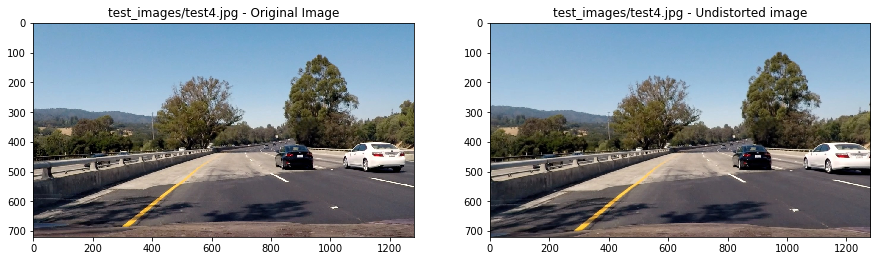

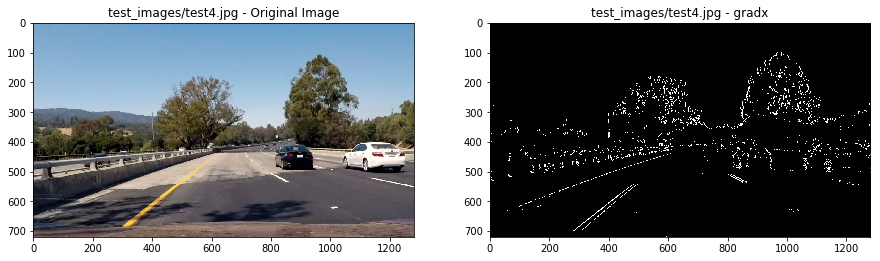

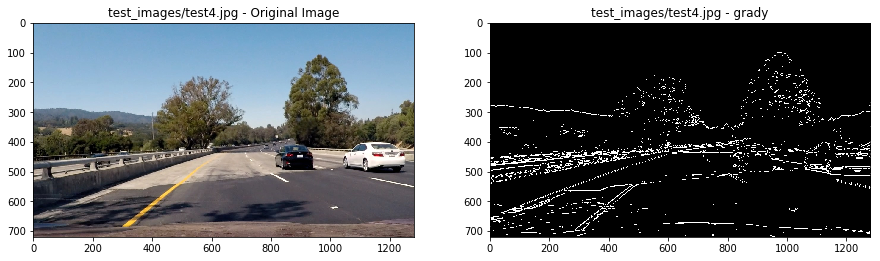

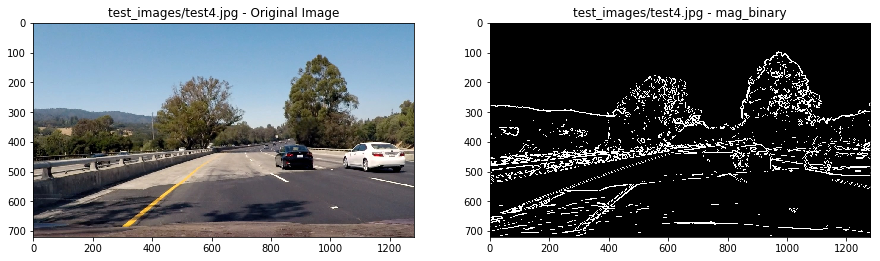

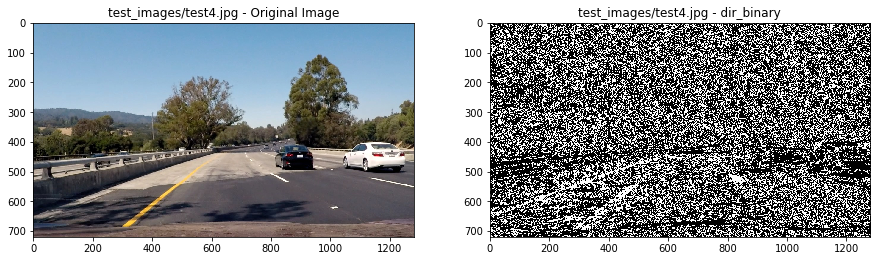

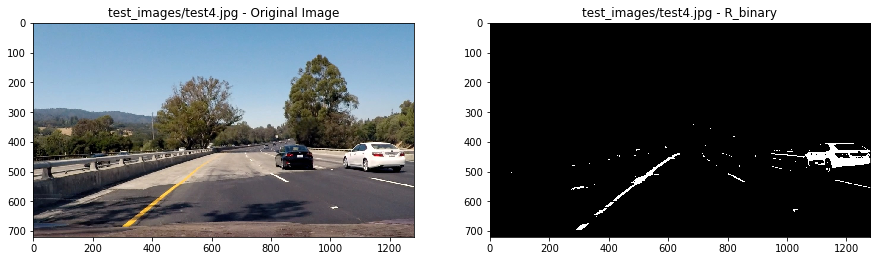

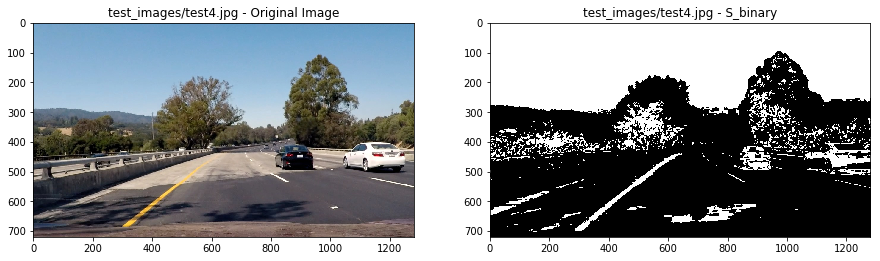

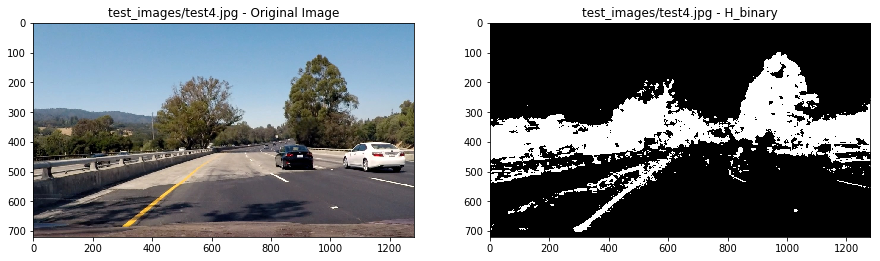

In [7]:
# Define a gradient threshold pipeline
def grad_threshold_pipeline_test(imageFile, testImgData,mtx,dist):
    plt.figure(figsize=(40,25))
    # Undistort the image
    undistImg = cv2.undistort(testImgData, mtx, dist, None, mtx)
    displayImageComparison(imageFile, testImgData, undistImg, ' - Undistorted image')
    
    # Calculate binary outputs from sobel thresholding
    gradx = abs_grad_sobel_threshold(undistImg, orient='x', sobel_kernel=sobel_kernel_grad_abs, thresh=grad_abs_thresh)
    displayImageComparison(imageFile, testImgData, gradx, ' - gradx', cmap='gray')
    
    grady = abs_grad_sobel_threshold(undistImg, orient='y', sobel_kernel=sobel_kernel_grad_abs, thresh=grad_abs_thresh)
    displayImageComparison(imageFile, testImgData, grady, ' - grady', cmap='gray')
    
    mag_binary = mag_sobel_threshold(undistImg, sobel_kernel=sobel_kernel_grad_mag, thresh=grad_mag_thresh)
    displayImageComparison(imageFile, testImgData, mag_binary, ' - mag_binary', cmap='gray')

    dir_binary = dir_sobel_threshold(undistImg, sobel_kernel=sobel_kernel_grad_dir, thresh=grad_dir_thresh)
    displayImageComparison(imageFile, testImgData, dir_binary, ' - dir_binary', cmap='gray')
    
    # Calculate binary outputs from color thresholding for 'S' channel in HLS color space
    R_binary = color_threshold_RGB(undistImg, color_channel='R', RGB_thresh=R_thresh)
    displayImageComparison(imageFile, testImgData, R_binary, ' - R_binary', cmap='gray')
    
    S_binary = color_threshold_HLS(undistImg, color_channel='S', HLS_thresh=S_thresh)
    displayImageComparison(imageFile, testImgData, S_binary, ' - S_binary', cmap='gray')
    
    H_binary = color_threshold_HLS(undistImg, color_channel='H', HLS_thresh=H_thresh)
    displayImageComparison(imageFile, testImgData, H_binary, ' - H_binary', cmap='gray')


testImg = 'test_images/test4.jpg'
testImgData = mpimg.imread(testImg)
grad_threshold_pipeline_test(testImg, testImgData,mtx,dist)

### *Test combined gradient thresholding on given test set*

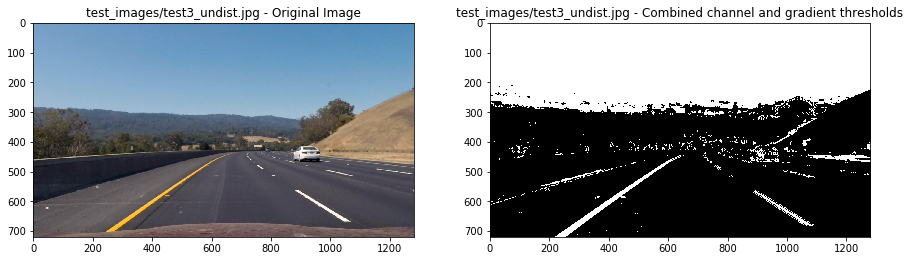

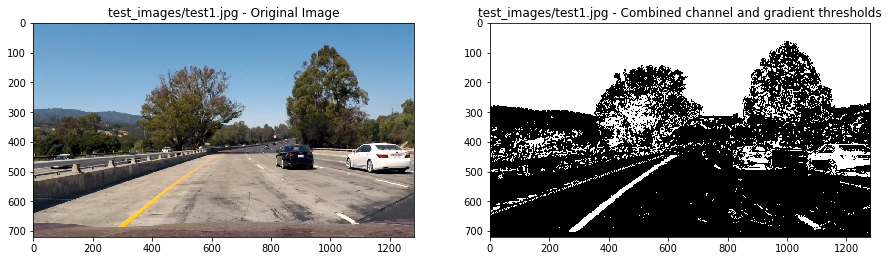

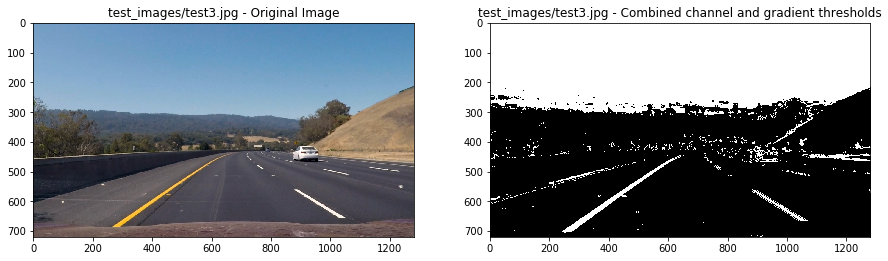

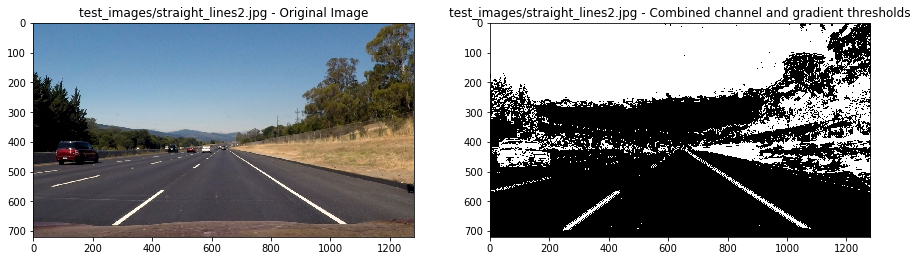

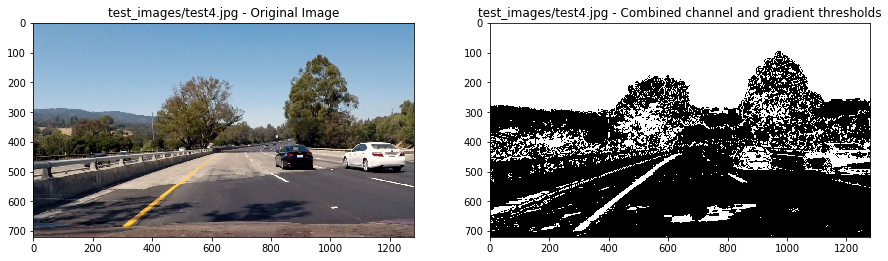

...

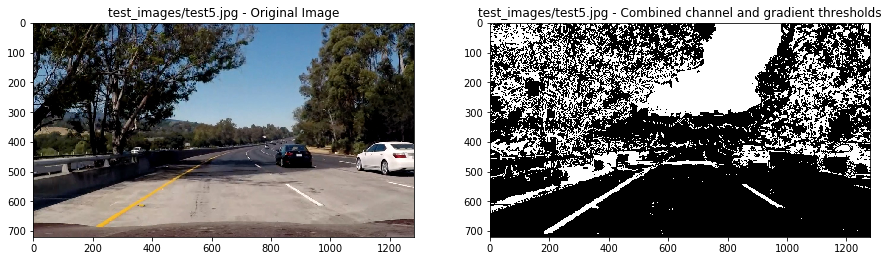

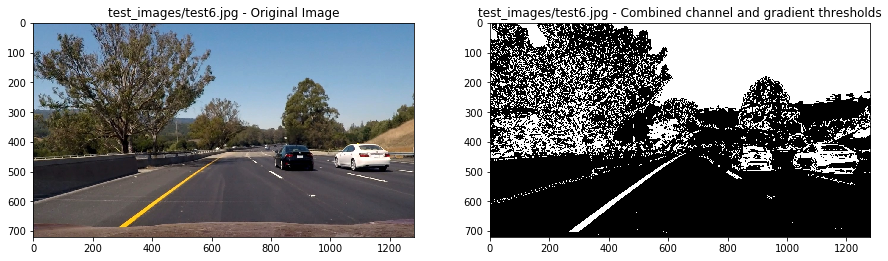

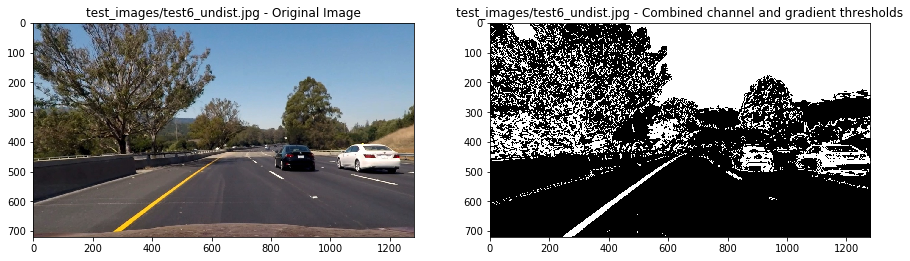

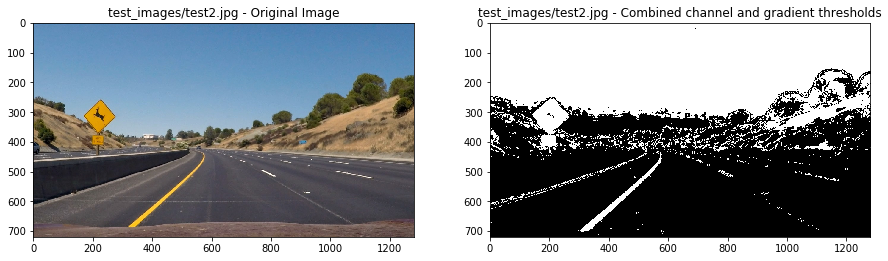

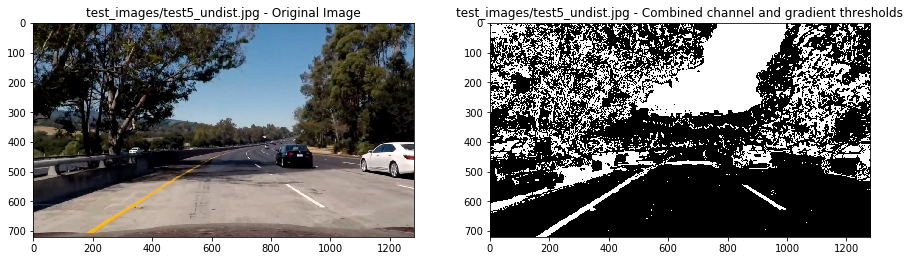

In [8]:
# Define the most difficult test set for thresholding
import os
#testImageList =  ["test_images/test4.jpg", "test_images/test5.jpg" , "test_images/test6.jpg"]

#===== Test on example images =======#
# Appending image names with directory path
imageFileNames = os.listdir("test_images/")
testImageFileList = []
for imageFileName in imageFileNames:
    testImageFileList.append("test_images/" + imageFileName)

# Creating output directory
testImagesOutDir = "test_images_output"
if not os.path.exists(testImagesOutDir):
    os.makedirs(testImagesOutDir)

# Try gradient thresholding for most difficult test images
for testImageFile in testImageFileList:
    # Read in the image
    image = mpimg.imread(testImageFile)
    # Get combined thresholded image from our pipeline
    combinedThresholdedImage = grad_threshold_pipeline(image,mtx,dist)
    # Plotting thresholded images
    displayImageComparison(testImageFile, image, combinedThresholdedImage, ' - Combined channel and gradient thresholds', cmap='gray')
    # Save image under "test_images_output" folder
    gradOutputImagePath = testImageFile.replace("test_images/","test_images_output/")
    cv2.imwrite(gradOutputImagePath, combinedThresholdedImage*255)
    

## Apply a perspective transform to rectify binary image ("birds-eye view")

True

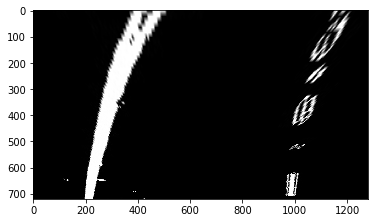

In [9]:
def perspective_transform(img, src, dst):      
    img_size = img.shape[1::-1]
    # Calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image
    warped = cv2.warpPerspective(img, M, img_size)
    # Return the warped image and matrix
    return warped, M

def warpUndistCombinedImg(undistCombinedImg, origUndistImg, src, dst):
    warped, M = perspective_transform(undistCombinedImg, src, dst)
    warped2, M2 = perspective_transform(origUndistImg, src, dst)
    return warped, M, warped2, M2

# Define a test image name
testImage = 'test3'
# Read in original test image
origTestImgFile = 'test_images/' + testImage + '.jpg'
origTestImg = mpimg.imread(origTestImgFile)
origUndistTestImg = UndistortImage(origTestImg, mtx , dist)
# Read in corresponding undistorted combined binary test image
undistCombinedTestImg = mpimg.imread('test_images_output/' + testImage + '.jpg')

# Define source and destination points for the 'undistCombinedTestImg'
cols, rows = undistCombinedTestImg.shape[::-1]
top_limit = 454 #450 # np.int(rows * 0.635)
down_limit = 700 # rows - 20
src_point1 = [246, down_limit]  #[280, down_limit] 
src_point2 = [620,top_limit] #[628, top_limit] # [590, top_limit]
src_point3 = [728, top_limit] #[724, top_limit] # [725, top_limit]
src_point4 = [1127, down_limit] # [1125, down_limit]
src = np.float32([src_point1, src_point2, src_point3, src_point4])
dst_point1 = [200, rows]
dst_point2 = [400, 0]
dst_point3 = [1200, 0]
dst_point4 = [1000, rows]
dst = np.float32([dst_point1, dst_point2, dst_point3, dst_point4])

# Extract warped image from undistorted combined image
warped, M, _, _ = warpUndistCombinedImg(undistCombinedTestImg, origUndistTestImg, src, dst)
plt.imshow(warped, cmap="gray")
cv2.imwrite(('test_images_output/' + testImage + '_warped.jpg'), warped)

## Detect lane pixels and fit to find the lane boundary

213.120794703
983.062369181


True

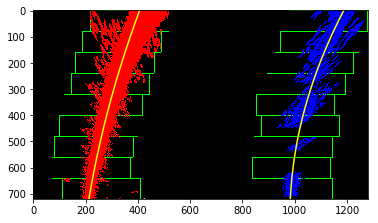

In [10]:
# Find the start points of the left and right lines at the bottom of the image in the X-direction
def findStartingLines(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint]) #argmax returns only the index, not the actual value
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    return leftx_base, rightx_base

def find_lane_pixels(binary_warped, leftx_base, rightx_base):
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 150
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero() # returns indices of non-zero elements in the matrix as two arrays each for first index(y) and second index (x)
    nonzeroy = np.array(nonzero[0]) # first index (y) of non-zero element
    nonzerox = np.array(nonzero[1]) #second index (x) of non-zero element
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one (startng with 0)
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height #roof of rectangle window
        win_y_high = binary_warped.shape[0] - window*window_height #base of rectangle window
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) #draw a G color rectangle with thickness 2
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped, leftx_base, rightx_base):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, leftx_base, rightx_base)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    return out_img, left_fit, right_fit, left_fitx, right_fitx, ploty

# Load our image
binaryWarpedTestImg = mpimg.imread('test_images_output/' + testImage + '_warped.jpg')

# Use histogram to find the base of left line and right line
leftx_base, rightx_base = findStartingLines(binaryWarpedTestImg)
out_img, left_fit, right_fit, left_fitx, right_fitx, ploty = fit_polynomial(binaryWarpedTestImg, leftx_base, rightx_base)
# Plots the left and right polynomials on the lane lines
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')

print(left_fitx[left_fitx.shape[0]-1])
print(right_fitx[left_fitx.shape[0]-1])

plt.imshow(out_img)
#plt.imshow(binaryWarpedTestImg)
cv2.imwrite('test_images_output/' + testImage + '_lanelinefitted.jpg', out_img)

# Determine the curvature of the lane and vehicle position with respect to center

### *Calculate curvature*

In [11]:
# Calculate the curvature of polynomial in real
def measure_curvature_real(img_shape, left_lane_coeffs, right_lane_coeffs, ym_per_pix, xm_per_pix):

    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])# to cover same y-range as image
    
    leftx = left_lane_coeffs[0]*ploty**2 + left_lane_coeffs[1]*ploty + left_lane_coeffs[2]
    rightx = right_lane_coeffs[0]*ploty**2 + right_lane_coeffs[1]*ploty + right_lane_coeffs[2]
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit_cr = np.polyfit(ploty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, rightx * xm_per_pix, 2)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    #right_curverad = 1
    return left_curverad, right_curverad

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30.0/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real(binaryWarpedTestImg.shape, left_fit, right_fit, ym_per_pix, xm_per_pix)

print(left_curverad, 'm', right_curverad, 'm')

1169.73505706 m 500.795034004 m


### *Calculate vehicle offset*

In [12]:
def GetVehicleOffset(img_shape, left_lane_coeffs, right_lane_coeffs, xm_per_pix):
    # Y co-ordinate is the bottom of the image where the camera is located
    y_eval = img_shape[0]

    # Calculate image center
    img_center = img_shape[1] / 2

    # calculate postition of left x and right x with given y_eval by applying formula
    leftx = left_lane_coeffs[0]*y_eval**2 + left_lane_coeffs[1]*y_eval + left_lane_coeffs[2]
    rightx = right_lane_coeffs[0]*y_eval**2 + right_lane_coeffs[1]*y_eval + right_lane_coeffs[2]
    
    # Calculate the lane center with the assumption that the camera is mounted at the center
    center_lane = (leftx + rightx) // 2

    return (center_lane - img_center) * xm_per_pix

xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Calulcate offset
vehicle_offset = GetVehicleOffset(binaryWarpedTestImg.shape, left_fit, right_fit, xm_per_pix)
print(vehicle_offset)

-0.227285714286


### *Visualization*

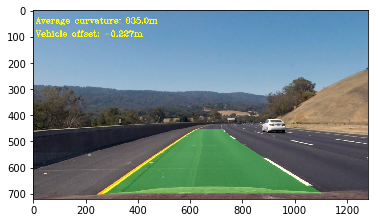

In [13]:
def DrawLaneArea(warped, ploty, left_fitx, right_fitx, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    
    return newwarp

def DrawInfo(img, curve, vehicle_offset):
    avgCurve = (curve[0] + curve[1]) // 2
    curvatureInfo = 'Average curvature: ' + str(avgCurve) + 'm'
    cv2.putText(img, (curvatureInfo), (10, 50), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 255, 0), 2, cv2.LINE_AA)
    cv2.putText(img, ('Vehicle offset: ' + str(round(vehicle_offset, 3)) + 'm'), (10, 100), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 255, 0), 2, cv2.LINE_AA)
    return img


# Undistort the original color image
undistImg = UndistortImage(origTestImg, mtx , dist)
M = cv2.getPerspectiveTransform(dst, src)

# Draw the line area as a new_warp image
new_warp = DrawLaneArea(warped, ploty, left_fitx, right_fitx, M)


# Combine the result with the original image
result = cv2.addWeighted(undistImg, 1, new_warp, 0.3, 0)

# Draw the info regarding average curvature and vehicle offset
result = DrawInfo(result, (left_curverad, right_curverad), vehicle_offset)
plt.imshow(result)


# Pipeline and testing for videos

### *Pipeline for video processing*

In [14]:
def findLaneLinesVideo(imageFrame_video):
    # Flag to know whether the lines in at least one frame is detected
    lanelineIdentified_video = 0
    
    # Read in image file and undistort
    origUndistImg_video = UndistortImage(imageFrame_video, mtx, dist)
    
    # Apply gradient and color thresholds on undistorted image to return combined binary image
    undistCombinedBinary_video = grad_threshold_pipeline(origUndistImg_video,mtx,dist)
    
    # Define source and destination points for the 'undistCombinedTestImg'
    cols_video, rows_video = undistCombinedBinary_video.shape[::-1]
    top_limit_video = 454 #450 # np.int(rows * 0.635)
    down_limit_video = 700 # rows - 20
    src_point1_video = [246, down_limit_video]  #[280, down_limit] 
    src_point2_video = [620,top_limit_video] #[628, top_limit] # [590, top_limit]
    src_point3_video = [728, top_limit_video] #[724, top_limit] # [725, top_limit]
    src_point4_video = [1127, down_limit_video] # [1125, down_limit]
    src_video = np.float32([src_point1_video, src_point2_video, src_point3_video, src_point4_video])
    dst_point1_video = [200, rows_video]
    dst_point2_video = [400, 0]
    dst_point3_video = [1200, 0]
    dst_point4_video = [1000, rows]
    dst_video = np.float32([dst_point1_video, dst_point2_video, dst_point3_video, dst_point4_video])
    
    #warped, M = warpUndistortedImage(combined_binary)
    warpedCombinedBinary_video, M_video = perspective_transform(undistCombinedBinary_video, src_video, dst_video)
    
    #warpedCombinedBinary, M, _, _ = warpUndistCombinedImg(undistCombinedBinary, origUndistImg, src, dst)
    if (lanelineIdentified_video==0):
        leftx_base_video, rightx_base_video = findStartingLines(warpedCombinedBinary_video)
        warpedLineFitted_video, left_fit_coeffs_video, right_fit_coeffs_video, left_fitx_video, right_fitx_video, ploty_video = fit_polynomial(warpedCombinedBinary_video, leftx_base_video, rightx_base_video)
    else: 
        warpedLineFitted_video, left_fit_coeffs_video, right_fit_coeffs_video, left_fitx_video, right_fitx_video, ploty_video = fit_polynomial(warpedCombinedBinary_video,leftx_base_video_prev, rightx_base_video_prev)
        lanelineIdentified_video = 1
        
    # Save the bottom pixel in x-direction of left and right lane for the next frame  
    leftx_base_video_prev = left_fitx[left_fitx.shape[0]-1]
    rightx_base_video_prev = right_fitx[left_fitx.shape[0]-1]

    
    # Define conversions in x and y from pixel-space to meters
    ym_per_pix_video = 30.0/720 # meters per pixel in y dimension
    xm_per_pix_video = 3.7/700 # meters per pixel in x dimension

    # Calculate the radius of curvature in meters for both lane lines
    left_curverad_video, right_curverad_video = measure_curvature_real(undistCombinedBinary_video.shape, left_fit_coeffs_video, right_fit_coeffs_video, ym_per_pix_video, xm_per_pix_video)
    vehicleOffset_video = GetVehicleOffset(undistCombinedBinary_video.shape, left_fit_coeffs_video, right_fit_coeffs_video, xm_per_pix_video)

    M3_video = cv2.getPerspectiveTransform(dst_video, src_video)
    newWarpLaneArea_video = DrawLaneArea(warpedCombinedBinary_video, ploty_video, left_fitx_video, right_fitx_video, M3_video)

    # Combine the result with the original image
    resultAddWeighted_video = cv2.addWeighted(origUndistImg_video, 1, newWarpLaneArea_video, 0.3, 0)

    # Draw curvature and vehicle offset info onto the final image
    resultFinal_video = DrawInfo(resultAddWeighted_video, (left_curverad_video, right_curverad_video), vehicleOffset_video)
    return resultFinal_video


### *Test video processing pipeline*

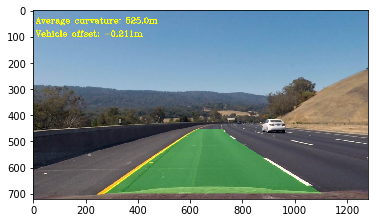

In [15]:
oriImgFileVideoTest = 'test_images/test3.jpg'
# Read in the image
imageDataVideoTest = mpimg.imread(oriImgFileVideoTest)
result = findLaneLinesVideo(imageDataVideoTest)
plt.imshow(result)


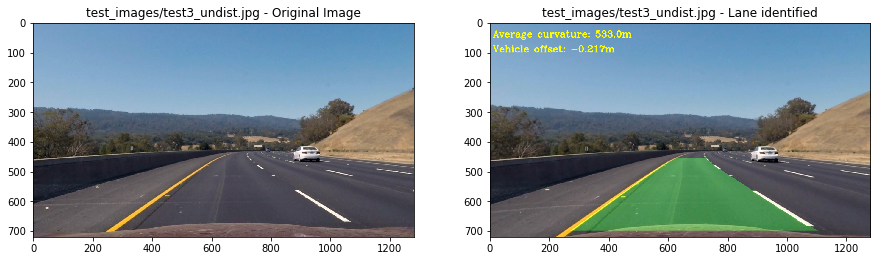

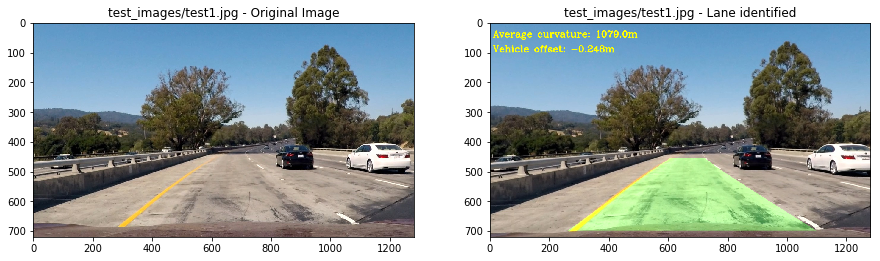

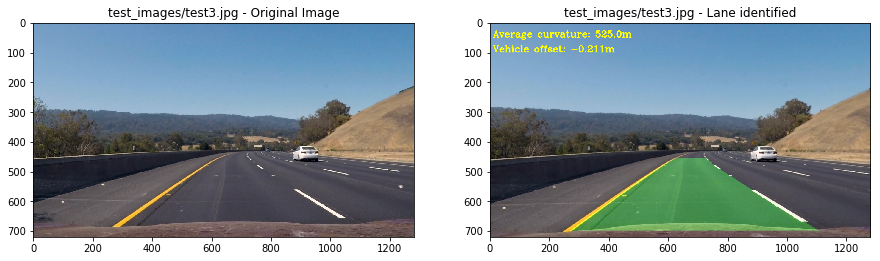

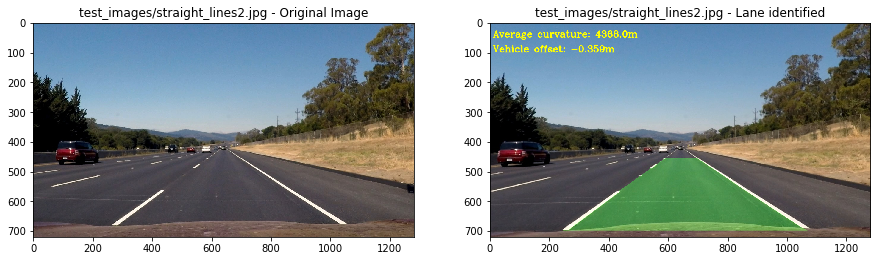

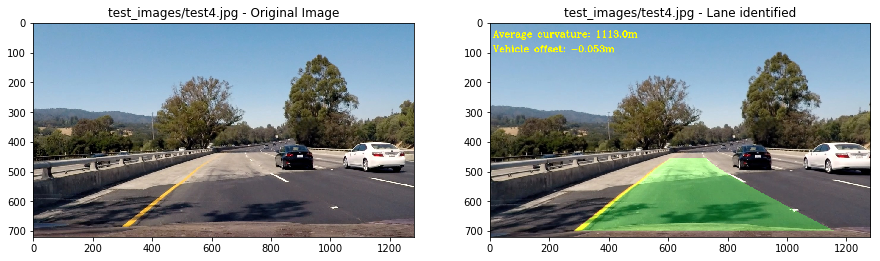

...

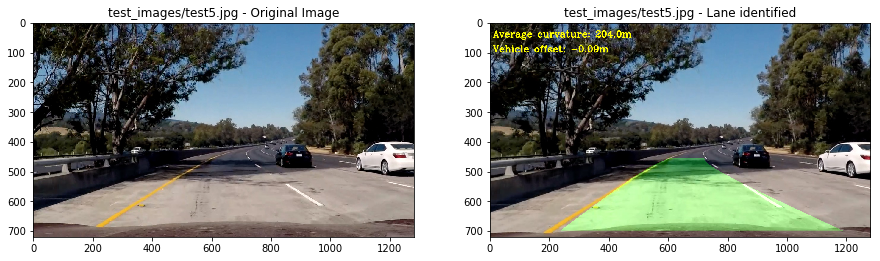

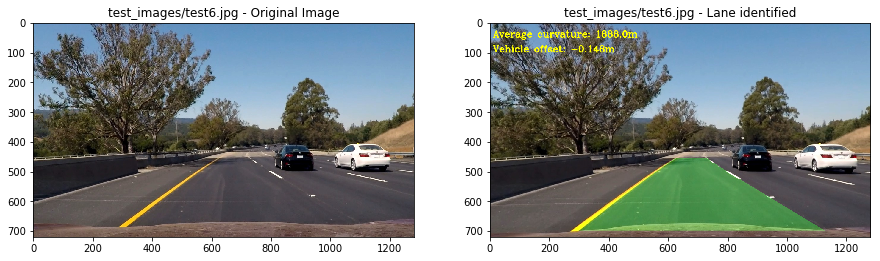

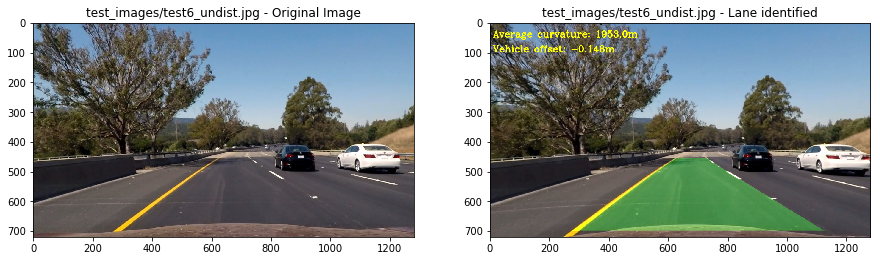

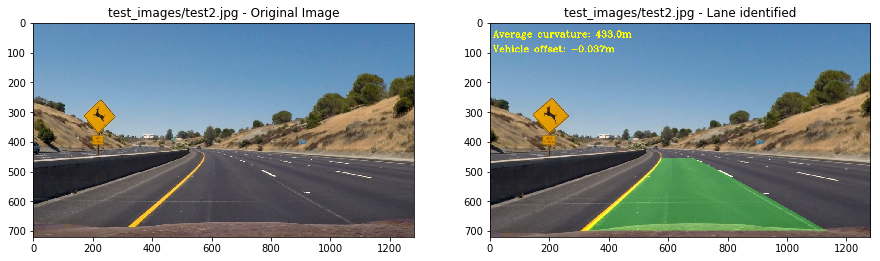

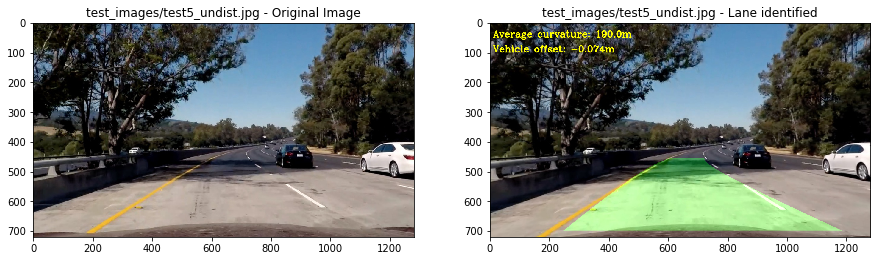

In [16]:
# Find lane in all given test pictures

test_images = os.listdir("test_images/")

for image_name in test_images:
    imageFile = "test_images/" + image_name
    imageData = mpimg.imread(imageFile)
    img_lanes = findLaneLinesVideo(imageData)
    img_lanes_RGB = cv2.cvtColor(img_lanes, cv2.COLOR_BGR2RGB)
    cv2.imwrite('output_images/' + image_name, img_lanes_RGB)
    displayImageComparison(imageFile, imageData, img_lanes, ' - Lane identified')

### *Test video processing pipeline on project_video.mp4*

In [17]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Create output directory for videos if it does not exist
testVideosOutDir =  'test_videos_output'
if not os.path.exists(testVideosOutDir):
    os.makedirs(testVideosOutDir)
    
testVideoFiles = ["project_video.mp4" , "challenge_video.mp4", "harder_challenge_video.mp4"]

In [18]:
########## project_video.mp4 #############

clip1 = VideoFileClip(testVideoFiles[0])
white_clip = clip1.fl_image(findLaneLinesVideo) #NOTE: this function expects color images!!

white_clip_output = 'test_videos_output/' + testVideoFiles[0]
%time white_clip.write_videofile(white_clip_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [07:20<00:00,  2.88it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 5min 13s, sys: 3.07 s, total: 5min 16s
Wall time: 7min 23s


In [19]:
########## challenge_video.mp4 #############
clip1 = VideoFileClip(testVideoFiles[1])
white_clip = clip1.fl_image(findLaneLinesVideo) #NOTE: this function expects color images!!

white_clip_output = 'test_videos_output/' + testVideoFiles[1]
%time white_clip.write_videofile(white_clip_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge_video.mp4
[MoviePy] Writing video test_videos_output/challenge_video.mp4


100%|██████████| 485/485 [02:42<00:00,  2.99it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge_video.mp4 

CPU times: user 1min 57s, sys: 1.22 s, total: 1min 58s
Wall time: 2min 45s


In [20]:
########## harder_challenge_video.mp4 #############
clip1 = VideoFileClip(testVideoFiles[2])
white_clip = clip1.fl_image(findLaneLinesVideo) #NOTE: this function expects color images!!

white_clip_output = 'test_videos_output/' + testVideoFiles[2]
%time white_clip.write_videofile(white_clip_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/harder_challenge_video.mp4
[MoviePy] Writing video test_videos_output/harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [08:03<00:00,  2.51it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/harder_challenge_video.mp4 

CPU times: user 5min 24s, sys: 3.25 s, total: 5min 28s
Wall time: 8min 7s
